#  Sentiment  Emotion Analysis Using NLP

## Business Case:The goal of sentiment analysis is to classify the text based on the mood or mentality expressed in the text, which can be positive negative, or neutral.

### Importing the necessary libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('sentiments.csv')

## Basic Checks

In [3]:
df.head()

,Unnamed: 0,Datetime,Tweet Id,Text,Username,sentiment,sentiment_score,emotion,emotion_score
0,0,2022-09-30 23:29:15+00:00,1.575990e+18,@Logitech @apple @Google @Microsoft @Dell @Len...,ManjuSreedaran,neutral,0.853283,anticipation,0.587121
1,1,2022-09-30 21:46:35+00:00,1.575970e+18,@MK_habit_addict @official_stier @MortalKombat...,MiKeMcDnet,neutral,0.519470,joy,0.886913
2,2,2022-09-30 21:18:02+00:00,1.575960e+18,"As @CRN celebrates its 40th anniversary, Bob F...",jfollett,positive,0.763791,joy,0.960347
3,3,2022-09-30 20:05:24+00:00,1.575940e+18,@dell your customer service is horrible especi...,daveccarr,negative,0.954023,anger,0.983203
4,4,2022-09-30 20:03:17+00:00,1.575940e+18,@zacokalo @Dell @DellCares @Dell give the man ...,heycamella,neutral,0.529170,anger,0.776124


In [4]:
df.tail()

,Unnamed: 0,Datetime,Tweet Id,Text,Username,sentiment,sentiment_score,emotion,emotion_score
24965,24965,2022-01-01 02:02:04+00:00,1.477100e+18,@ElDarkAngel2 @GamersNexus @Dell I wouldn't ev...,Eodart,negative,0.682981,anger,0.906309
24966,24966,2022-01-01 01:57:34+00:00,1.477100e+18,@kite_real @GamersNexus @Dell I didn't really ...,Eodart,positive,0.743940,joy,0.951701
24967,24967,2022-01-01 01:36:36+00:00,1.477090e+18,Hey @JoshTheFixer here it is....27 4K UHD USB-...,Corleone250,neutral,0.654463,anticipation,0.471185
24968,24968,2022-01-01 01:31:30+00:00,1.477090e+18,@bravadogaming @thewolfpena @Alienware @intel ...,MrTwistyyy,neutral,0.794049,anticipation,0.747014
24969,24969,2022-01-01 00:59:37+00:00,1.477080e+18,@rabia_ejaz @Dell Stopped buying windows lapto...,IDevourNehari,positive,0.733861,joy,0.958346


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24970 entries, 0 to 24969
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Unnamed: 0       24970 non-null  int64  
 1   Datetime         24970 non-null  object 
 2   Tweet Id         24970 non-null  float64
 3   Text             24970 non-null  object 
 4   Username         24970 non-null  object 
 5   sentiment        24970 non-null  object 
 6   sentiment_score  24970 non-null  float64
 7   emotion          24970 non-null  object 
 8   emotion_score    24970 non-null  float64
dtypes: float64(3), int64(1), object(5)
memory usage: 1.7+ MB


In [6]:
df.describe()

,Unnamed: 0,Tweet Id,sentiment_score,emotion_score
count,24970.000000,2.497000e+04,24970.000000,24970.000000
mean,12484.500000,1.526448e+18,0.782578,0.819114
std,7208.362447,2.765400e+16,0.150751,0.195378
min,0.000000,1.477080e+18,0.337307,0.125480
25%,6242.250000,1.503810e+18,0.664537,0.722941
50%,12484.500000,1.524810e+18,0.817950,0.906610
75%,18726.750000,1.550128e+18,0.912815,0.970360
max,24969.000000,1.575990e+18,0.991532,0.994312


In [7]:
df.shape

(24970, 9)

In [8]:
df.columns

Index(['Unnamed: 0', 'Datetime', 'Tweet Id', 'Text', 'Username', 'sentiment',
       'sentiment_score', 'emotion', 'emotion_score'],
      dtype='object')

In [9]:
df.isnull().sum()

Unnamed: 0         0
Datetime           0
Tweet Id           0
Text               0
Username           0
sentiment          0
sentiment_score    0
emotion            0
emotion_score      0
dtype: int64

In [10]:
df.duplicated().sum()

0

In [11]:
df = df.drop(['Unnamed: 0', 'Tweet Id'], axis = 1)

In [12]:
df.head()

,Datetime,Text,Username,sentiment,sentiment_score,emotion,emotion_score
0,2022-09-30 23:29:15+00:00,@Logitech @apple @Google @Microsoft @Dell @Len...,ManjuSreedaran,neutral,0.853283,anticipation,0.587121
1,2022-09-30 21:46:35+00:00,@MK_habit_addict @official_stier @MortalKombat...,MiKeMcDnet,neutral,0.519470,joy,0.886913
2,2022-09-30 21:18:02+00:00,"As @CRN celebrates its 40th anniversary, Bob F...",jfollett,positive,0.763791,joy,0.960347
3,2022-09-30 20:05:24+00:00,@dell your customer service is horrible especi...,daveccarr,negative,0.954023,anger,0.983203
4,2022-09-30 20:03:17+00:00,@zacokalo @Dell @DellCares @Dell give the man ...,heycamella,neutral,0.529170,anger,0.776124


In [13]:
df.shape

(24970, 7)

In [14]:
df.duplicated().sum()

1

In [15]:
df = df.drop_duplicates()

In [16]:
df.isnull().sum()

Datetime           0
Text               0
Username           0
sentiment          0
sentiment_score    0
emotion            0
emotion_score      0
dtype: int64

In [17]:
df.describe()

,sentiment_score,emotion_score
count,24969.000000,24969.000000
mean,0.782570,0.819107
std,0.150749,0.195379
min,0.337307,0.125480
25%,0.664532,0.722928
50%,0.817927,0.906597
75%,0.912793,0.970332
max,0.991532,0.994312


In [18]:
df['sentiment'].value_counts()

sentiment
negative    10556
positive     7365
neutral      7048
Name: count, dtype: int64

In [19]:
 df['sentiment'].unique()

array(['neutral', 'positive', 'negative'], dtype=object)

## Exploratory Data Analysis

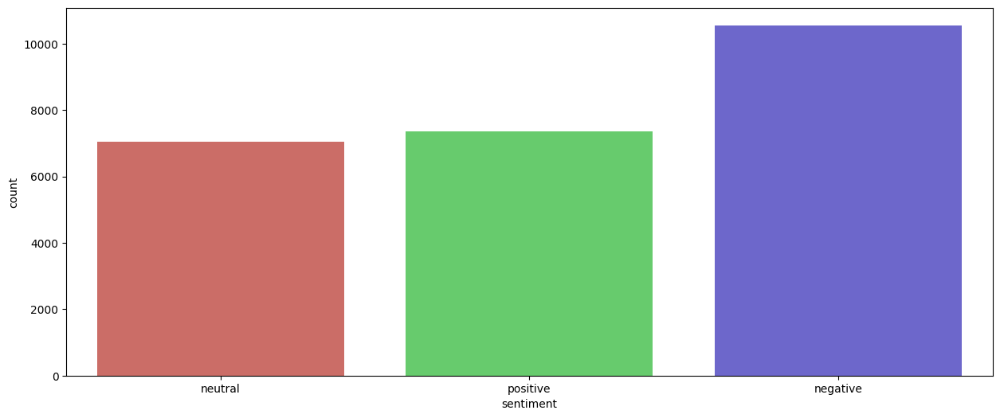

In [20]:
plt.figure(figsize=(15,6))
sns.countplot(x='sentiment',data = df,palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

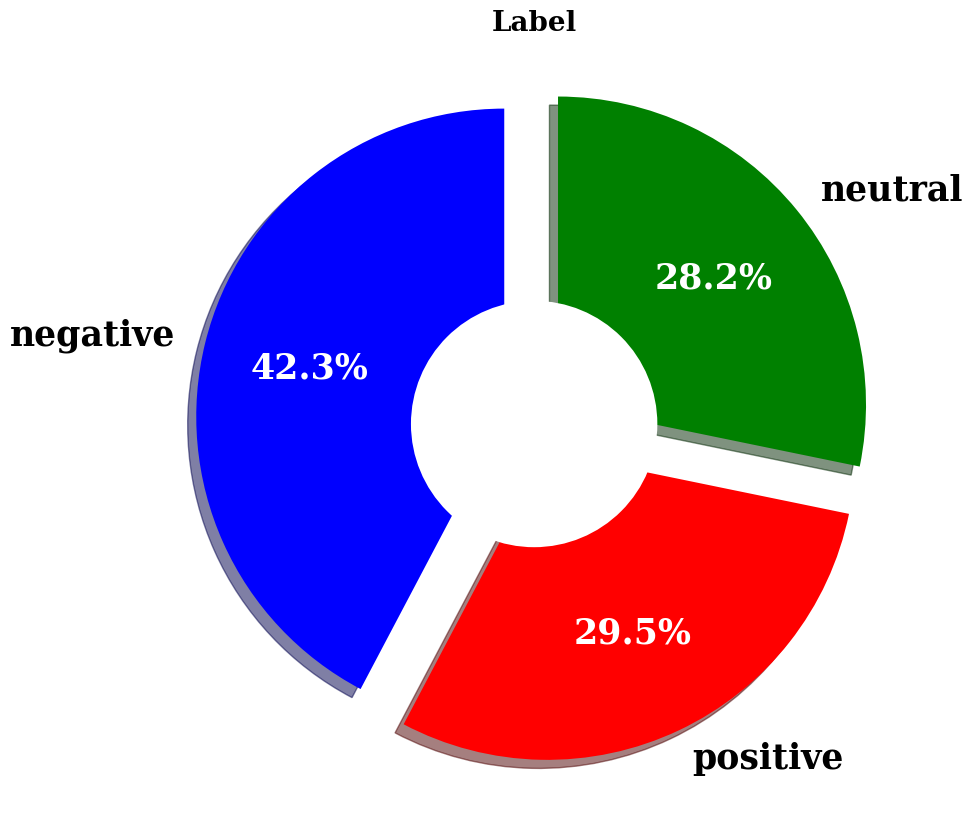

In [21]:
label_data = df['sentiment'].value_counts()

explode = (0.1, 0.1, 0.1)
plt.figure(figsize=(14, 10))
patches, texts, pcts = plt.pie(label_data,
                               labels = label_data.index,
                               colors = ['blue', 'red', 'green'],
                               pctdistance = 0.65,
                               shadow = True,
                               startangle = 90,
                               explode = explode,
                               autopct = '%1.1f%%',
                               textprops={ 'fontsize': 25,
                                           'color': 'black',
                                           'weight': 'bold',
                                           'family': 'serif' })
plt.setp(pcts, color='white')

hfont = {'fontname':'serif', 'weight': 'bold'}
plt.title('Label', size=20, **hfont)

centre_circle = plt.Circle((0,0),0.40,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.show()

In [22]:
!pip install plotly

In [23]:
import plotly.graph_objects as go

In [24]:
fig = go.Figure(data=[go.Bar(x=df['sentiment'].value_counts().index, y=df['sentiment'].value_counts())])
fig.update_layout(
        title= 'Sentiment',
        xaxis_title="Categories",
        yaxis_title="Count"
    )
fig.show()

In [25]:
counts = df['sentiment'].value_counts()
fig = go.Figure(data=[go.Pie(labels=counts.index, values=counts)])
fig.update_layout(title= 'sentiment')
fig.show()

In [26]:
df['emotion'].unique()

array(['anticipation', 'joy', 'anger', 'sadness', 'fear', 'optimism',
       'disgust', 'surprise'], dtype=object)

In [27]:
df['emotion'].value_counts()

emotion
anger           7520
joy             6325
anticipation    5171
disgust         3000
sadness         1328
optimism        1225
fear             366
surprise          34
Name: count, dtype: int64

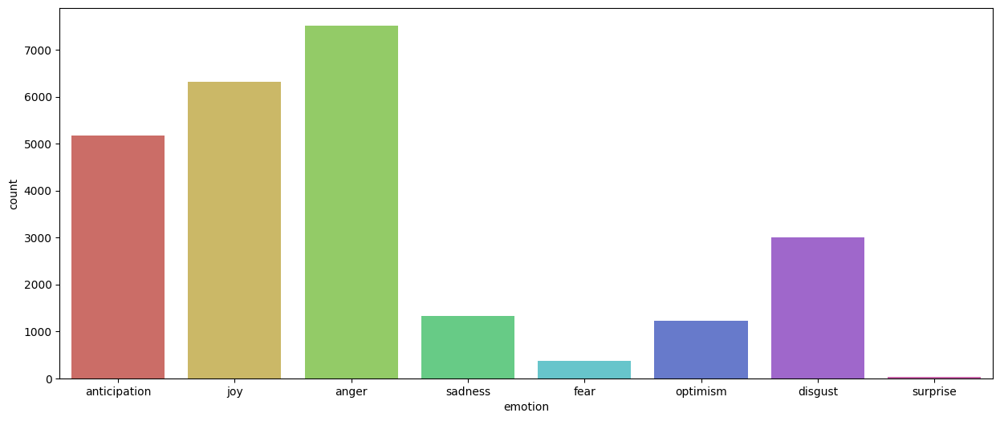

In [28]:
plt.figure(figsize=(15,6))
sns.countplot(x='emotion', data=df,palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

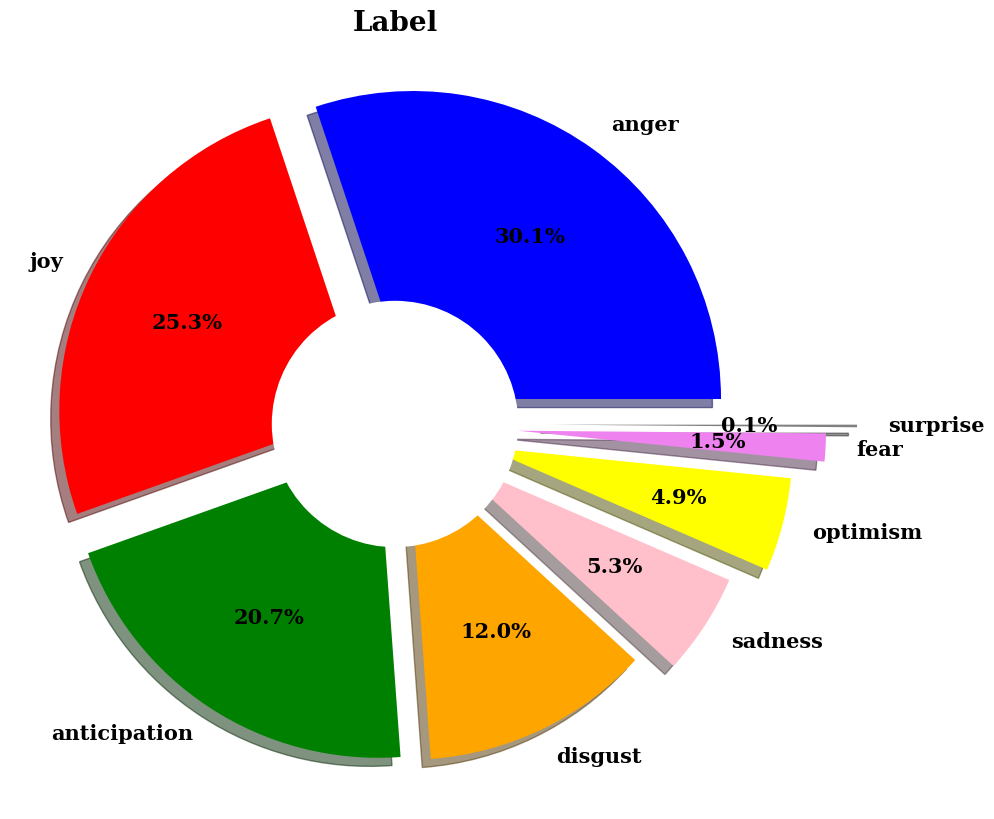

In [29]:
label_data = df['emotion'].value_counts()

explode = (0.1, 0.1, 0.1, 0.1, 0.2, 0.3, 0.4, 0.5)
plt.figure(figsize=(14, 10))
patches, texts, pcts = plt.pie(label_data,
                               labels = label_data.index,
                               colors = ['blue', 'red', 'green', 'orange', 'pink', 'yellow', 'violet', 'grey'],
                               pctdistance = 0.65,
                               shadow = True,
                               startangle = 0,
                               explode = explode,
                               autopct = '%1.1f%%',
                               textprops={ 'fontsize': 15,
                                           'color': 'black',
                                           'weight': 'bold',
                                           'family': 'serif' })
plt.setp(pcts, color='black')

hfont = {'fontname':'serif', 'weight': 'bold'}
plt.title('Label', size=20, **hfont)

centre_circle = plt.Circle((0,0),0.40,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.show()

In [30]:
fig = go.Figure(data=[go.Bar(x=df['emotion'].value_counts().index, y=df['emotion'].value_counts())])
fig.update_layout(
        title= 'Emotion',
        xaxis_title="Categories",
        yaxis_title="Count"
    )
fig.show()

In [31]:
counts = df['emotion'].value_counts()
fig = go.Figure(data=[go.Pie(labels=counts.index, values=counts)])
fig.update_layout(title= 'Emotion')
fig.show()

C:\Users\ST\AppData\Local\Temp\ipykernel_6304\1944679337.py:2: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



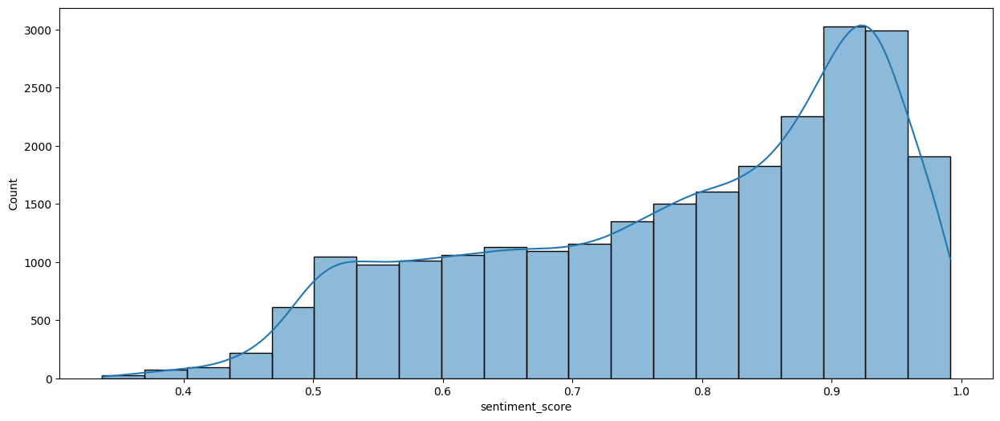

In [32]:
plt.figure(figsize=(15,6))
sns.histplot(df['sentiment_score'], kde = True, bins = 20, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

In [33]:
import plotly.io as pio

fig = go.Figure(data=[go.Histogram(x=df['sentiment_score'], nbinsx=20, marker_color='lightskyblue')])

fig.update_layout(
    title="Sentiment Score Histogram",
    xaxis_title="Sentiment Score",
    yaxis_title="Frequency",
    xaxis=dict(tickangle=0),
    bargap=0.2,
    bargroupgap=0.1,
    autosize=False,
    width=800,
    height=400
)

pio.show(fig)

C:\Users\ST\AppData\Local\Temp\ipykernel_6304\912092522.py:2: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



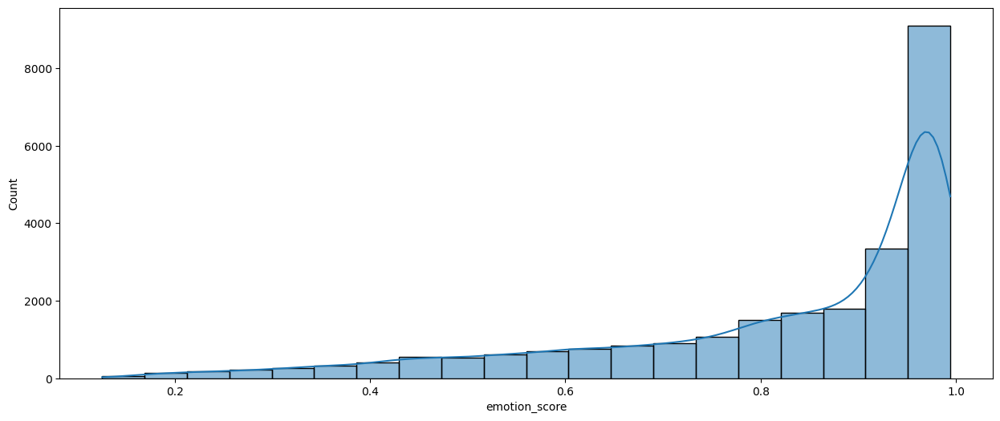

In [34]:
plt.figure(figsize=(15,6))
sns.histplot(df['emotion_score'], kde = True, bins = 20, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

In [35]:
fig = go.Figure(data=[go.Histogram(x=df['emotion_score'], nbinsx=20, marker_color='lightskyblue')])

fig.update_layout(
    title="Emotion Score Histogram",
    xaxis_title="Emotion Score",
    yaxis_title="Frequency",
    xaxis=dict(tickangle=0),
    bargap=0.2,
    bargroupgap=0.1,
    autosize=False,
    width=800,
    height=400
)

pio.show(fig)

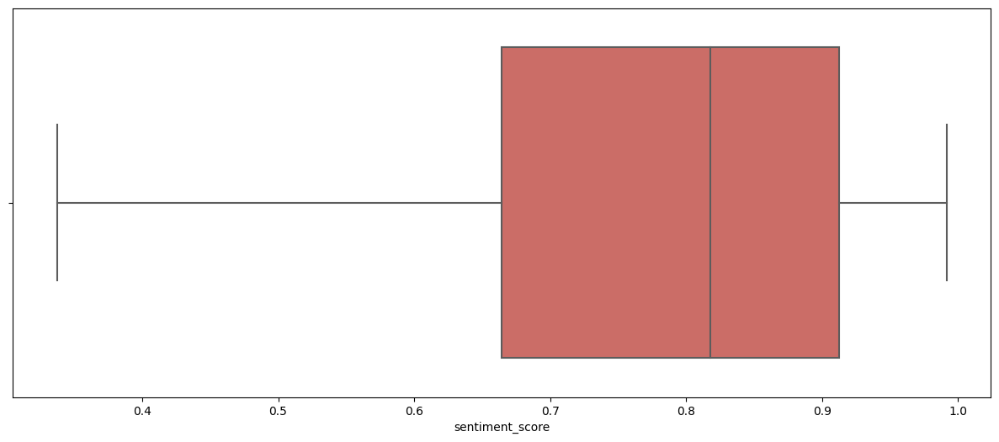

In [36]:
plt.figure(figsize=(15,6))
sns.boxplot(x='sentiment_score', data = df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

In [37]:
import plotly.express as px

fig = px.box(df, y='sentiment_score')
fig.update_layout(title='Box Plot of Sentiment Scores')
fig.show()

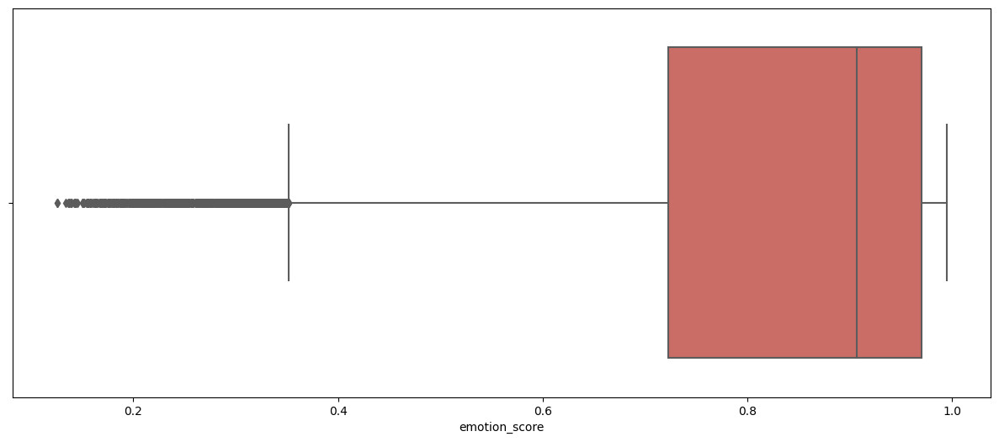

In [38]:
plt.figure(figsize=(15,6))
sns.boxplot(x='emotion_score', data = df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

In [39]:
fig = px.box(df, y='emotion_score')
fig.update_layout(title='Box Plot of Emotion Scores')
fig.show()

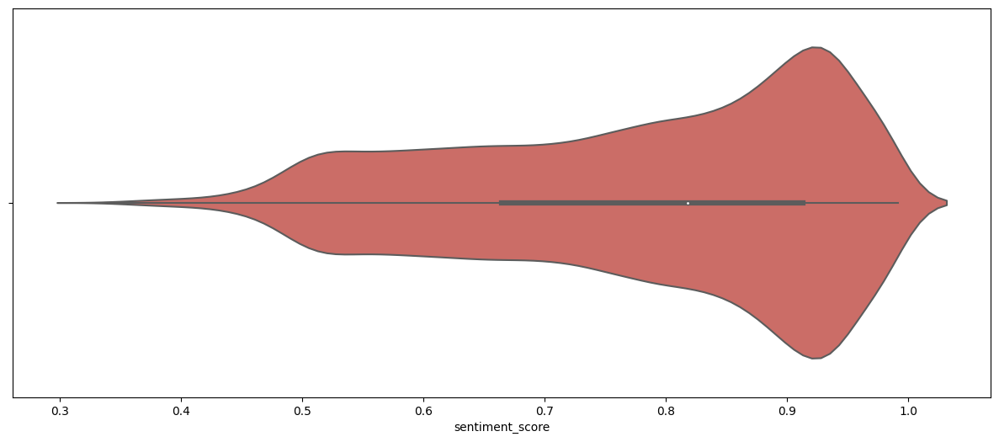

In [40]:
plt.figure(figsize=(15,6))
sns.violinplot(x='sentiment_score', data = df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

In [41]:
fig = px.violin(df, y='sentiment_score')
fig.update_layout(title='Violin Plot of Sentiment Scores')
fig.show()

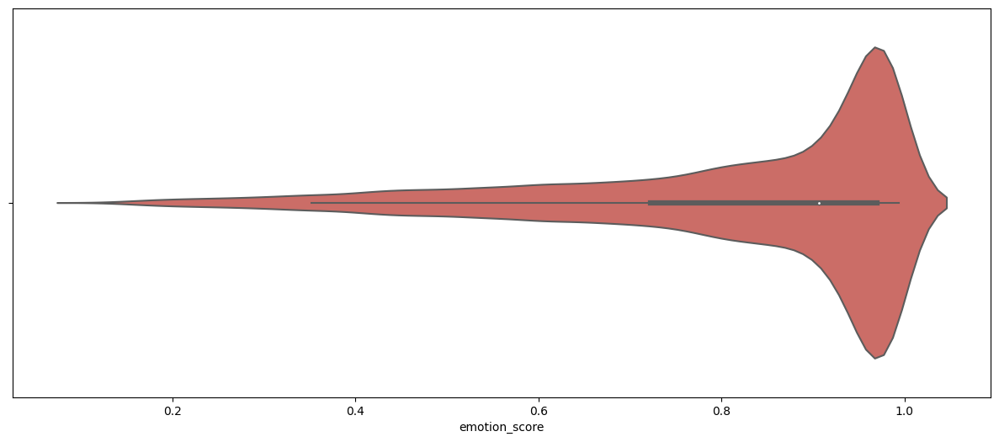

In [42]:
plt.figure(figsize=(15,6))
sns.violinplot(x='emotion_score', data = df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

In [43]:
fig = px.violin(df, y='emotion_score')
fig.update_layout(title='Violin Plot of Emotion Scores')
fig.show()

C:\Users\ST\AppData\Local\Temp\ipykernel_6304\3031638146.py:2: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




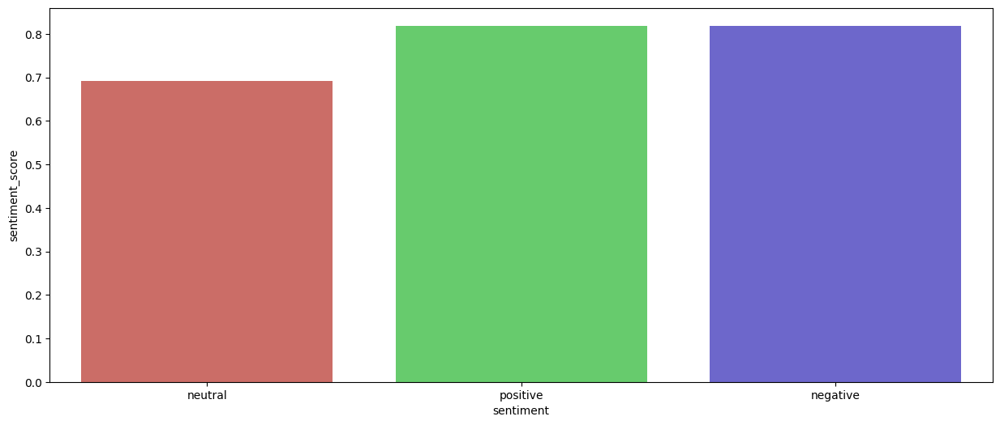

In [44]:
plt.figure(figsize=(15,6))
sns.barplot(x = df['sentiment'], y = df['sentiment_score'], data = df, ci = None, palette = 'hls')
plt.show()

C:\Users\ST\AppData\Local\Temp\ipykernel_6304\71093321.py:2: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




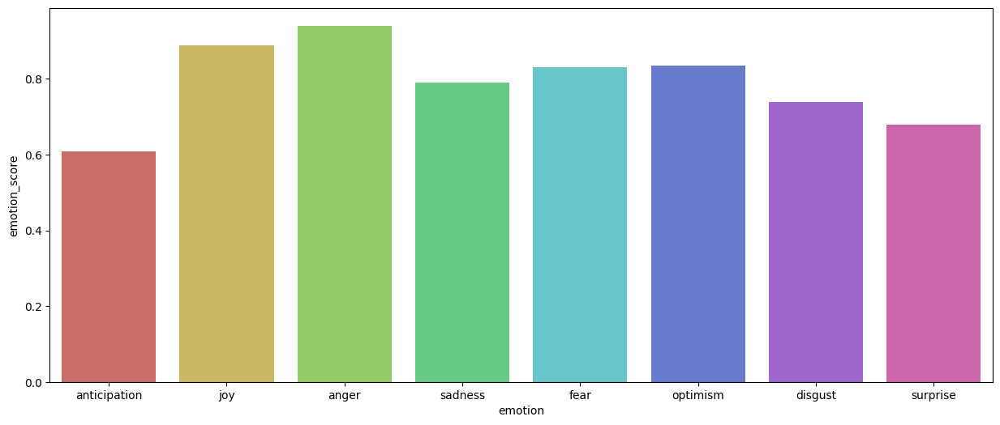

In [45]:
plt.figure(figsize=(15,6))
sns.barplot(x = df['emotion'], y = df['emotion_score'], data = df, ci = None, palette = 'hls')
plt.show()

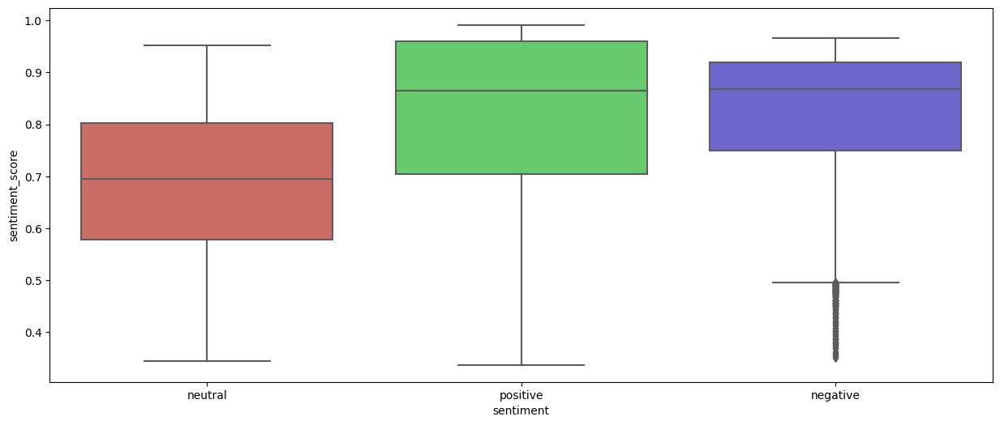

In [46]:
plt.figure(figsize=(15,6))
sns.boxplot(x = df['sentiment'], y = df['sentiment_score'], data = df, palette = 'hls')
plt.show()

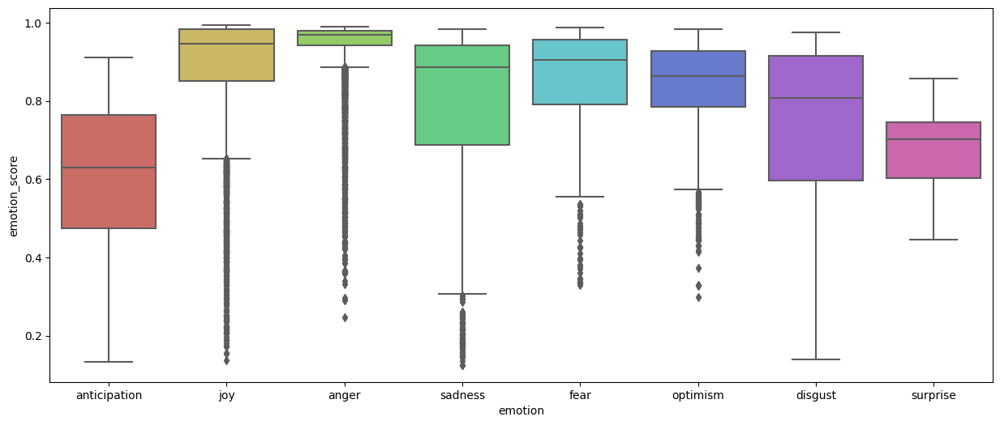

In [47]:
plt.figure(figsize=(15,6))
sns.boxplot(x = df['emotion'], y = df['emotion_score'], data = df, palette = 'hls')
plt.show()

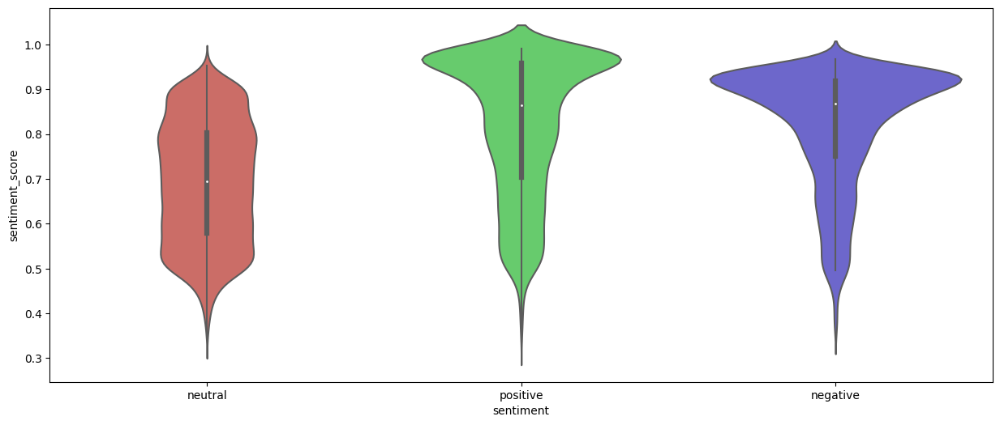

In [48]:
plt.figure(figsize=(15,6))
sns.violinplot(x = df['sentiment'], y = df['sentiment_score'], data = df, palette = 'hls')
plt.show()

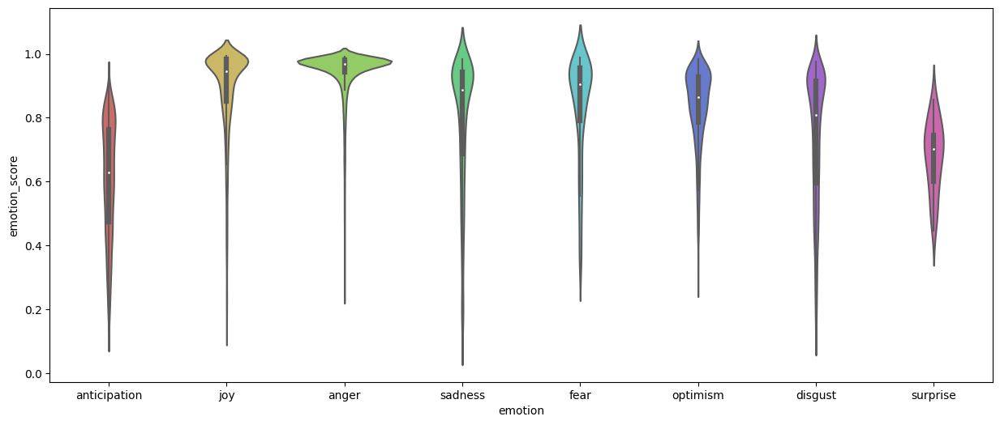

In [49]:
plt.figure(figsize=(15,6))
sns.violinplot(x = df['emotion'], y = df['emotion_score'], data = df, palette = 'hls')
plt.show()

C:\Users\ST\AppData\Local\Temp\ipykernel_6304\1391507249.py:2: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.


C:\Users\ST\AppData\Local\Temp\ipykernel_6304\1391507249.py:2: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



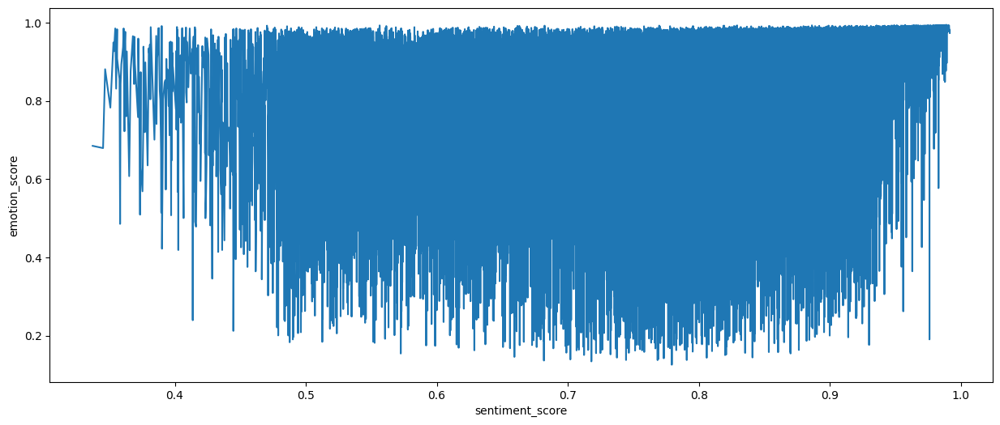

In [50]:
plt.figure(figsize=(15,6))
sns.lineplot(x = df['sentiment_score'], y = df['emotion_score'], data = df, ci = None, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

C:\Users\ST\AppData\Local\Temp\ipykernel_6304\3648819915.py:2: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



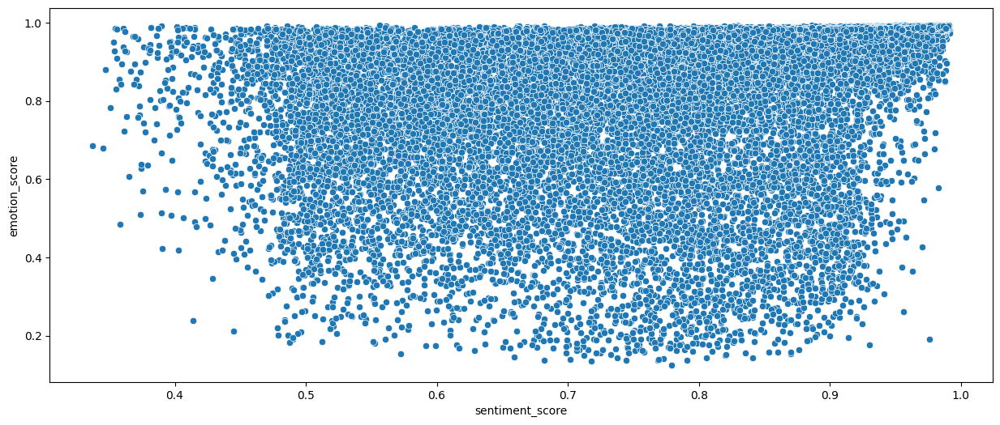

In [51]:
plt.figure(figsize=(15,6))
sns.scatterplot(x =df['sentiment_score'], y = df['emotion_score'], data = df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

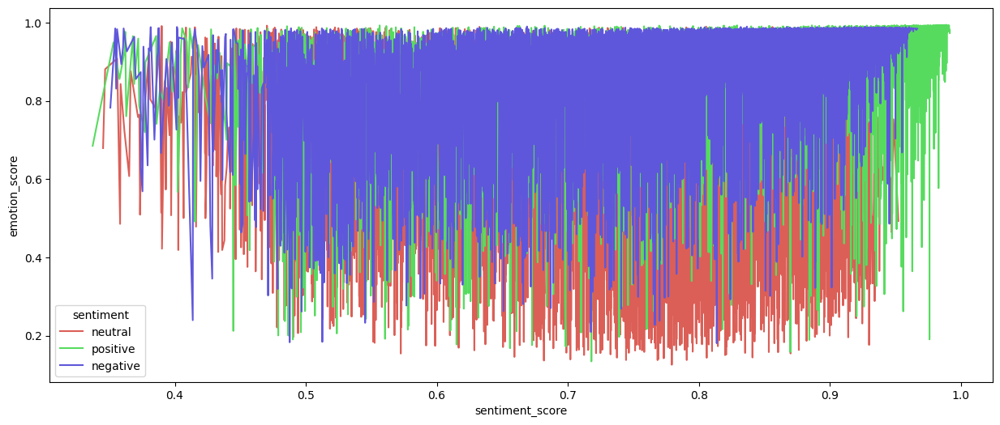

In [52]:
plt.figure(figsize=(15,6))
sns.lineplot(x = df['sentiment_score'], y = df['emotion_score'], hue = df['sentiment'], data = df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

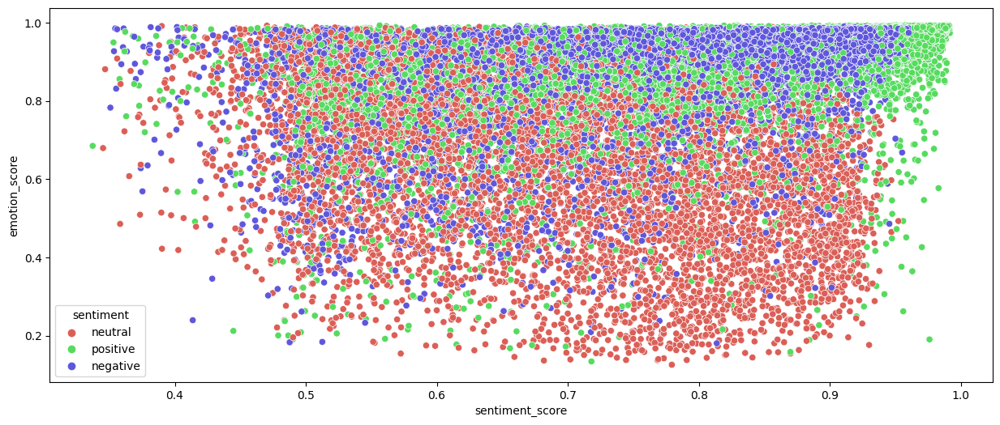

In [53]:
plt.figure(figsize=(15,6))
sns.scatterplot(x = df['sentiment_score'], y = df['emotion_score'], hue = df['sentiment'], data = df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

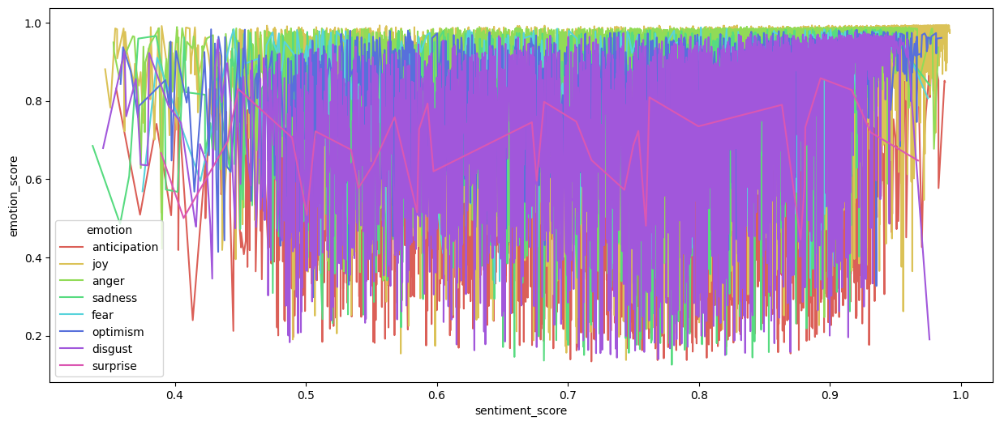

In [54]:
plt.figure(figsize=(15,6))
sns.lineplot(x = df['sentiment_score'], y = df['emotion_score'], hue = df['emotion'], data = df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

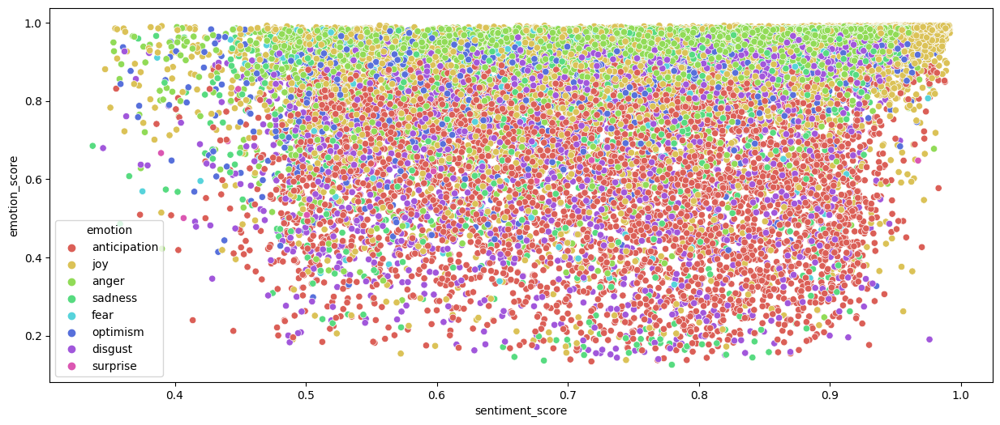

In [55]:
plt.figure(figsize=(15,6))
sns.scatterplot(x = df['sentiment_score'], y = df['emotion_score'], hue = df['emotion'], data = df,palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

In [56]:
df['Datetime'] = pd.to_datetime(df['Datetime'])

In [57]:
df

,Datetime,Text,Username,sentiment,sentiment_score,emotion,emotion_score
0,2022-09-30 23:29:15+00:00,@Logitech @apple @Google @Microsoft @Dell @Len...,ManjuSreedaran,neutral,0.853283,anticipation,0.587121
1,2022-09-30 21:46:35+00:00,@MK_habit_addict @official_stier @MortalKombat...,MiKeMcDnet,neutral,0.519470,joy,0.886913
2,2022-09-30 21:18:02+00:00,"As @CRN celebrates its 40th anniversary, Bob F...",jfollett,positive,0.763791,joy,0.960347
3,2022-09-30 20:05:24+00:00,@dell your customer service is horrible especi...,daveccarr,negative,0.954023,anger,0.983203
4,2022-09-30 20:03:17+00:00,@zacokalo @Dell @DellCares @Dell give the man ...,heycamella,neutral,0.529170,anger,0.776124
...,...,...,...,...,...,...,...
24965,2022-01-01 02:02:04+00:00,@ElDarkAngel2 @GamersNexus @Dell I wouldn't ev...,Eodart,negative,0.682981,anger,0.906309
24966,2022-01-01 01:57:34+00:00,@kite_real @GamersNexus @Dell I didn't really ...,Eodart,positive,0.743940,joy,0.951701
24967,2022-01-01 01:36:36+00:00,Hey @JoshTheFixer here it is....27 4K UHD USB-...,Corleone250,neutral,0.654463,anticipation,0.471185
24968,2022-01-01 01:31:30+00:00,@bravadogaming @thewolfpena @Alienware @intel ...,MrTwistyyy,neutral,0.794049,anticipation,0.747014


In [58]:
df.columns

Index(['Datetime', 'Text', 'Username', 'sentiment', 'sentiment_score',
       'emotion', 'emotion_score'],
      dtype='object')

# Feature Engineering

In [59]:
df['Day'] = df['Datetime'].dt.day
df['Month'] = df['Datetime'].dt.month
df['Year'] = df['Datetime'].dt.year

In [60]:
df

,Datetime,Text,Username,sentiment,sentiment_score,emotion,emotion_score,Day,Month,Year
0,2022-09-30 23:29:15+00:00,@Logitech @apple @Google @Microsoft @Dell @Len...,ManjuSreedaran,neutral,0.853283,anticipation,0.587121,30,9,2022
1,2022-09-30 21:46:35+00:00,@MK_habit_addict @official_stier @MortalKombat...,MiKeMcDnet,neutral,0.519470,joy,0.886913,30,9,2022
2,2022-09-30 21:18:02+00:00,"As @CRN celebrates its 40th anniversary, Bob F...",jfollett,positive,0.763791,joy,0.960347,30,9,2022
3,2022-09-30 20:05:24+00:00,@dell your customer service is horrible especi...,daveccarr,negative,0.954023,anger,0.983203,30,9,2022
4,2022-09-30 20:03:17+00:00,@zacokalo @Dell @DellCares @Dell give the man ...,heycamella,neutral,0.529170,anger,0.776124,30,9,2022
...,...,...,...,...,...,...,...,...,...,...
24965,2022-01-01 02:02:04+00:00,@ElDarkAngel2 @GamersNexus @Dell I wouldn't ev...,Eodart,negative,0.682981,anger,0.906309,1,1,2022
24966,2022-01-01 01:57:34+00:00,@kite_real @GamersNexus @Dell I didn't really ...,Eodart,positive,0.743940,joy,0.951701,1,1,2022
24967,2022-01-01 01:36:36+00:00,Hey @JoshTheFixer here it is....27 4K UHD USB-...,Corleone250,neutral,0.654463,anticipation,0.471185,1,1,2022
24968,2022-01-01 01:31:30+00:00,@bravadogaming @thewolfpena @Alienware @intel ...,MrTwistyyy,neutral,0.794049,anticipation,0.747014,1,1,2022


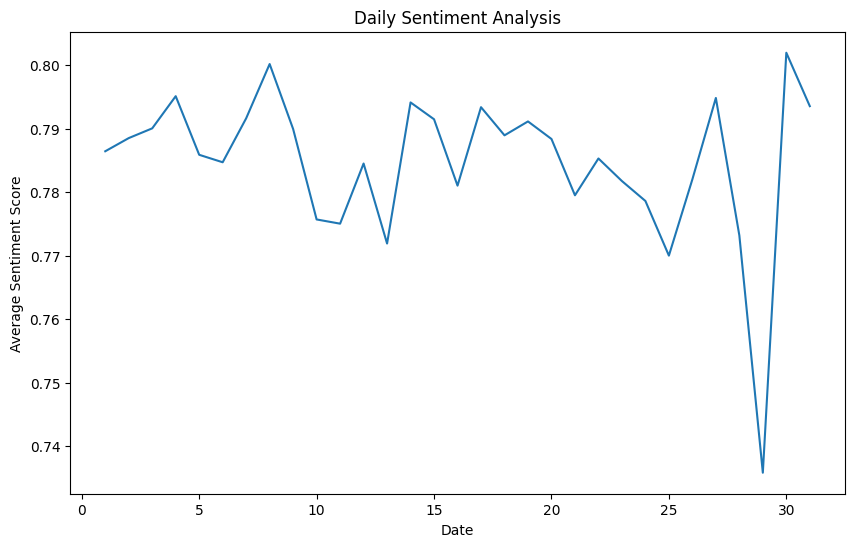

In [61]:
# Group by day and calculate average sentiment score
daily_sentiment = df.groupby(df['Day'])['sentiment_score'].mean()

# Visualize daily sentiment scores
plt.figure(figsize=(10, 6))
plt.plot(daily_sentiment.index, daily_sentiment.values)
plt.xlabel('Date')
plt.ylabel('Average Sentiment Score')
plt.title('Daily Sentiment Analysis')
plt.show()

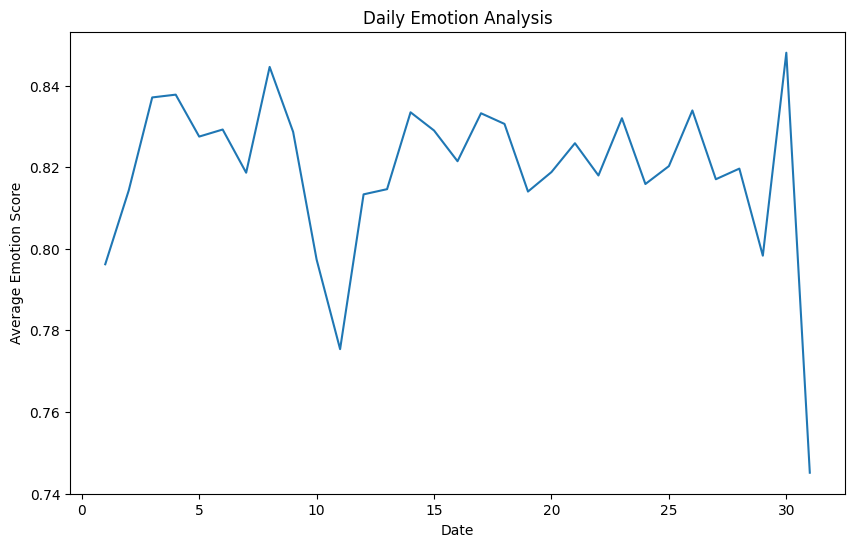

In [62]:
daily_emotion = df.groupby(df['Day'])['emotion_score'].mean()
plt.figure(figsize=(10, 6))
plt.plot(daily_emotion.index, daily_emotion.values)
plt.xlabel('Date')
plt.ylabel('Average Emotion Score')
plt.title('Daily Emotion Analysis')
plt.show()

In [63]:
# Group by day and calculate average sentiment score
daily_sentiment = df.groupby(df['Day'])['sentiment_score'].mean().reset_index()

# Visualize daily sentiment scores
fig = px.line(daily_sentiment, x='Day', y='sentiment_score', title='Daily Sentiment Analysis')
fig.update_layout(xaxis_title='Date', yaxis_title='Average Sentiment Score')
fig.show()

In [64]:
# Group by day and calculate average emotion score
daily_emotion = df.groupby(df['Day'])['emotion_score'].mean().reset_index()

# Visualize daily emotion scores
fig = px.line(daily_emotion, x='Day', y='emotion_score', title='Daily Emotion Analysis')
fig.update_layout(xaxis_title='Date', yaxis_title='Average Emotion Score')
fig.show()

In [65]:
df1 = df.copy()

In [66]:
# Prepare the data
df1.set_index('Datetime', inplace=True)

# Calculate daily average sentiment score
daily_sentiment = df1['sentiment_score'].resample('D').mean()

# Plot daily sentiment analysis
fig = px.line(daily_sentiment, x=daily_sentiment.index, y=daily_sentiment.values)
fig.update_layout(
    title="Daily Sentiment Analysis",
    xaxis_title="Date",
    yaxis_title="Average Sentiment Score"
)
fig.show()

# Calculate daily average emotion score
daily_emotion = df1['emotion_score'].resample('D').mean()

# Plot daily emotion analysis
fig = px.line(daily_emotion, x=daily_emotion.index, y=daily_emotion.values)
fig.update_layout(
    title="Daily Emotion Analysis",
    xaxis_title="Date",
    yaxis_title="Average Emotion Score"
)
fig.show()

In [67]:
df2 = df.copy()

In [68]:
# Prepare the data
df2.set_index('Datetime', inplace=True)

# Resample the data to get daily sentiment scores for each category
daily_sentiments = df2.groupby(['Day', 'sentiment'])['sentiment_score'].mean().unstack()

# Plot the comparative analysis
fig = go.Figure()

# Add traces for each sentiment category
for sentiment in ['positive', 'negative', 'neutral']:
    fig.add_trace(go.Scatter(
        x=daily_sentiments.index,
        y=daily_sentiments[sentiment],
        mode='lines',
        name=sentiment.capitalize()
    ))

fig.update_layout(
    title="Comparative Sentiment Analysis",
    xaxis_title="Date",
    yaxis_title="Average Sentiment Score",
    legend_title="Sentiment"
)
fig.show()

In [69]:
df3 = df.copy()

In [70]:
# Prepare the data
df3.set_index('Datetime', inplace=True)

# Resample the data to get daily emotion scores for each category
daily_emotions = df3.groupby(['Day', 'emotion'])['emotion_score'].mean().unstack()

# Plot the comparative analysis
fig = go.Figure()

# Add traces for each emotion category
for emotion in ['anticipation', 'joy', 'anger', 'sadness', 'fear', 'optimism',
       'disgust', 'surprise']:
    fig.add_trace(go.Scatter(
        x=daily_emotions.index,
        y=daily_emotions[emotion],
        mode='lines',
        name=emotion.capitalize()
    ))

fig.update_layout(
    title="Comparative Emotion Analysis",
    xaxis_title="Date",
    yaxis_title="Average Emotion Score",
    legend_title="Emotion"
)
fig.show()

In [71]:
df

,Datetime,Text,Username,sentiment,sentiment_score,emotion,emotion_score,Day,Month,Year
0,2022-09-30 23:29:15+00:00,@Logitech @apple @Google @Microsoft @Dell @Len...,ManjuSreedaran,neutral,0.853283,anticipation,0.587121,30,9,2022
1,2022-09-30 21:46:35+00:00,@MK_habit_addict @official_stier @MortalKombat...,MiKeMcDnet,neutral,0.519470,joy,0.886913,30,9,2022
2,2022-09-30 21:18:02+00:00,"As @CRN celebrates its 40th anniversary, Bob F...",jfollett,positive,0.763791,joy,0.960347,30,9,2022
3,2022-09-30 20:05:24+00:00,@dell your customer service is horrible especi...,daveccarr,negative,0.954023,anger,0.983203,30,9,2022
4,2022-09-30 20:03:17+00:00,@zacokalo @Dell @DellCares @Dell give the man ...,heycamella,neutral,0.529170,anger,0.776124,30,9,2022
...,...,...,...,...,...,...,...,...,...,...
24965,2022-01-01 02:02:04+00:00,@ElDarkAngel2 @GamersNexus @Dell I wouldn't ev...,Eodart,negative,0.682981,anger,0.906309,1,1,2022
24966,2022-01-01 01:57:34+00:00,@kite_real @GamersNexus @Dell I didn't really ...,Eodart,positive,0.743940,joy,0.951701,1,1,2022
24967,2022-01-01 01:36:36+00:00,Hey @JoshTheFixer here it is....27 4K UHD USB-...,Corleone250,neutral,0.654463,anticipation,0.471185,1,1,2022
24968,2022-01-01 01:31:30+00:00,@bravadogaming @thewolfpena @Alienware @intel ...,MrTwistyyy,neutral,0.794049,anticipation,0.747014,1,1,2022


In [72]:
df4=df.copy()

In [73]:
df4.columns

Index(['Datetime', 'Text', 'Username', 'sentiment', 'sentiment_score',
       'emotion', 'emotion_score', 'Day', 'Month', 'Year'],
      dtype='object')

In [74]:
df4 = df[['Text','sentiment','sentiment_score','emotion','emotion_score']]

In [75]:
df4

,Text,sentiment,sentiment_score,emotion,emotion_score
0,@Logitech @apple @Google @Microsoft @Dell @Len...,neutral,0.853283,anticipation,0.587121
1,@MK_habit_addict @official_stier @MortalKombat...,neutral,0.519470,joy,0.886913
2,"As @CRN celebrates its 40th anniversary, Bob F...",positive,0.763791,joy,0.960347
3,@dell your customer service is horrible especi...,negative,0.954023,anger,0.983203
4,@zacokalo @Dell @DellCares @Dell give the man ...,neutral,0.529170,anger,0.776124
...,...,...,...,...,...
24965,@ElDarkAngel2 @GamersNexus @Dell I wouldn't ev...,negative,0.682981,anger,0.906309
24966,@kite_real @GamersNexus @Dell I didn't really ...,positive,0.743940,joy,0.951701
24967,Hey @JoshTheFixer here it is....27 4K UHD USB-...,neutral,0.654463,anticipation,0.471185
24968,@bravadogaming @thewolfpena @Alienware @intel ...,neutral,0.794049,anticipation,0.747014


# Data Preprocessing 

In [76]:
def clean_text(text):
    text = text.lower()
    return text.strip()

In [77]:
df.Text = df4.Text.apply(lambda x: clean_text(x))

In [78]:
df['Text']

0        @logitech @apple @google @microsoft @dell @len...
1        @mk_habit_addict @official_stier @mortalkombat...
2        as @crn celebrates its 40th anniversary, bob f...
3        @dell your customer service is horrible especi...
4        @zacokalo @dell @dellcares @dell give the man ...
                               ...                        
24965    @eldarkangel2 @gamersnexus @dell i wouldn't ev...
24966    @kite_real @gamersnexus @dell i didn't really ...
24967    hey @joshthefixer here it is....27 4k uhd usb-...
24968    @bravadogaming @thewolfpena @alienware @intel ...
24969    @rabia_ejaz @dell stopped buying windows lapto...
Name: Text, Length: 24969, dtype: object

In [79]:
import string
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [80]:
def remove_punctuation(text):
    punctuationfree="".join([i for i in text if i not in string.punctuation])
    return punctuationfree

In [81]:
df4.Text= df4['Text'].apply(lambda x:remove_punctuation(x))

C:\Users\ST\AppData\Local\Temp\ipykernel_6304\292793457.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [82]:
df4['Text']

0        Logitech apple Google Microsoft Dell Lenovo Wh...
1        MKhabitaddict officialstier MortalKombat newze...
2        As CRN celebrates its 40th anniversary Bob Fal...
3        dell your customer service is horrible especia...
4        zacokalo Dell DellCares Dell give the man what...
                               ...                        
24965    ElDarkAngel2 GamersNexus Dell I wouldnt even k...
24966    kitereal GamersNexus Dell I didnt really leave...
24967    Hey JoshTheFixer here it is27 4K UHD USBC by D...
24968    bravadogaming thewolfpena Alienware intel Inte...
24969    rabiaejaz Dell Stopped buying windows laptops ...
Name: Text, Length: 24969, dtype: object

In [83]:
import re
def tokenization(text):
    tokens = re.split('W+',text)
    return tokens

In [84]:
df4['Text']= df4['Text'].apply(lambda x: tokenization(x))

C:\Users\ST\AppData\Local\Temp\ipykernel_6304\201069144.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [85]:
df4['Text']

0        [Logitech apple Google Microsoft Dell Lenovo ,...
1        [MKhabitaddict officialstier MortalKombat newz...
2        [As CRN celebrates its 40th anniversary Bob Fa...
3        [dell your customer service is horrible especi...
4        [zacokalo Dell DellCares Dell give the man wha...
                               ...                        
24965    [ElDarkAngel2 GamersNexus Dell I wouldnt even ...
24966    [kitereal GamersNexus Dell I didnt really leav...
24967    [Hey JoshTheFixer here it is27 4K UHD USBC by ...
24968    [bravadogaming thewolfpena Alienware intel Int...
24969    [rabiaejaz Dell Stopped buying windows laptops...
Name: Text, Length: 24969, dtype: object

In [86]:
import nltk
nltk.download('stopwords')
stopwords = nltk.corpus.stopwords.words('english')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ST\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [87]:
stopwords

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [88]:
def remove_stopwords(text):
    output= " ".join(i for i in text if i not in stopwords)
    return output

In [89]:
df4['Text']= df4['Text'].apply(lambda x:remove_stopwords(x))

C:\Users\ST\AppData\Local\Temp\ipykernel_6304\674055211.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [90]:
df['Text']

0        @logitech @apple @google @microsoft @dell @len...
1        @mk_habit_addict @official_stier @mortalkombat...
2        as @crn celebrates its 40th anniversary, bob f...
3        @dell your customer service is horrible especi...
4        @zacokalo @dell @dellcares @dell give the man ...
                               ...                        
24965    @eldarkangel2 @gamersnexus @dell i wouldn't ev...
24966    @kite_real @gamersnexus @dell i didn't really ...
24967    hey @joshthefixer here it is....27 4k uhd usb-...
24968    @bravadogaming @thewolfpena @alienware @intel ...
24969    @rabia_ejaz @dell stopped buying windows lapto...
Name: Text, Length: 24969, dtype: object

In [91]:
from nltk.stem import WordNetLemmatizer
wordnet_lemmatizer = WordNetLemmatizer()

In [92]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\ST\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [93]:
nltk.download('omw-1.4')

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\ST\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [94]:
def lemmatizer(text):
    lemm_text = "".join([wordnet_lemmatizer.lemmatize(word) for word in text])
    return lemm_text

In [95]:
df4['Text']=df4['Text'].apply(lambda x:lemmatizer(x))

C:\Users\ST\AppData\Local\Temp\ipykernel_6304\984108913.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [96]:
df4['Text']

0        Logitech apple Google Microsoft Dell Lenovo  h...
1        MKhabitaddict officialstier MortalKombat newze...
2        As CRN celebrates its 40th anniversary Bob Fal...
3        dell your customer service is horrible especia...
4        zacokalo Dell DellCares Dell give the man what...
                               ...                        
24965    ElDarkAngel2 GamersNexus Dell I wouldnt even k...
24966    kitereal GamersNexus Dell I didnt really leave...
24967    Hey JoshTheFixer here it is27 4K UHD USBC by D...
24968    bravadogaming thewolfpena Alienware intel Inte...
24969    rabiaejaz Dell Stopped buying windows laptops ...
Name: Text, Length: 24969, dtype: object

In [97]:
def clean_text(text):
    text = re.sub('\[.*\]','', text).strip() 
    text = re.sub('\S*\d\S*\s*','', text).strip()  
    return text.strip()

In [98]:
df4['Text'] = df4.Text.apply(lambda x: clean_text(x))

C:\Users\ST\AppData\Local\Temp\ipykernel_6304\1628808121.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [99]:
df4['Text']

0        Logitech apple Google Microsoft Dell Lenovo  h...
1        MKhabitaddict officialstier MortalKombat newze...
2        As CRN celebrates its anniversary Bob Faletra ...
3        dell your customer service is horrible especia...
4        zacokalo Dell DellCares Dell give the man what...
                               ...                        
24965    GamersNexus Dell I wouldnt even know what to b...
24966    kitereal GamersNexus Dell I didnt really leave...
24967    Hey JoshTheFixer here it UHD USBC by Dell http...
24968    bravadogaming thewolfpena Alienware intel Inte...
24969    rabiaejaz Dell Stopped buying windows laptops ...
Name: Text, Length: 24969, dtype: object

In [100]:
!pip install -U spacy

In [101]:
import spacy

spacy.cli.download("en_core_web_sm")
nlp = spacy.load("en_core_web_sm")

✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [102]:
stopwords = nlp.Defaults.stop_words
def lemmatizer(text):
    doc = nlp(text)
    sent = [token.lemma_ for token in doc if not token.text in set(stopwords)]
    return ' '.join(sent)

In [103]:
df4['Text'] =  df4.Text.apply(lambda x: lemmatizer(x))

C:\Users\ST\AppData\Local\Temp\ipykernel_6304\961121293.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [104]:
def remove_urls(vTEXT):
    vTEXT = re.sub(r'(https|http)?:\/\/(\w|\.|\/|\?|\=|\&|\%)*\b', '', vTEXT, flags=re.MULTILINE)
    return(vTEXT)

In [105]:
df4['Text'] = df4.Text.apply(lambda x: remove_urls(x))

C:\Users\ST\AppData\Local\Temp\ipykernel_6304\2504040636.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [106]:
df4['Text']

0        logitech apple Google Microsoft Dell Lenovo   ...
1        MKhabitaddict officialsti MortalKombat newzeal...
2        as   CRN   celebrate anniversary   Bob Faletra...
3        dell customer service horrible especially agen...
4                     zacokalo Dell DellCares Dell man pay
                               ...                        
24965    GamersNexus Dell I not know blow whistle the p...
24966    kitereal GamersNexus Dell I not leave ethical ...
24967    hey JoshTheFixer UHD usbc Dell httpstcoqRlOBzJxoA
24968    bravadogame thewolfpena Alienware intel IntelA...
24969    rabiaejaz Dell stop buy window laptop longtime...
Name: Text, Length: 24969, dtype: object

In [107]:
def remove_digits(text):
    clean_text = re.sub(r"\b[0-9]+\b\s*", "", text)
    return(text)

In [108]:
df4['Text'] = df4.Text.apply(lambda x: remove_digits(x))

C:\Users\ST\AppData\Local\Temp\ipykernel_6304\3358671427.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [109]:
df4['Text']

0        logitech apple Google Microsoft Dell Lenovo   ...
1        MKhabitaddict officialsti MortalKombat newzeal...
2        as   CRN   celebrate anniversary   Bob Faletra...
3        dell customer service horrible especially agen...
4                     zacokalo Dell DellCares Dell man pay
                               ...                        
24965    GamersNexus Dell I not know blow whistle the p...
24966    kitereal GamersNexus Dell I not leave ethical ...
24967    hey JoshTheFixer UHD usbc Dell httpstcoqRlOBzJxoA
24968    bravadogame thewolfpena Alienware intel IntelA...
24969    rabiaejaz Dell stop buy window laptop longtime...
Name: Text, Length: 24969, dtype: object

In [110]:
def remove_digits1(sample_text):
    clean_text = " ".join([w for w in sample_text.split() if not w.isdigit()]) 
    return(clean_text)

In [111]:
df4['Text'] = df4.Text.apply(lambda x: remove_digits1(x))

C:\Users\ST\AppData\Local\Temp\ipykernel_6304\3205516263.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [112]:
df4['Text']

0        logitech apple Google Microsoft Dell Lenovo ha...
1        MKhabitaddict officialsti MortalKombat newzeal...
2        as CRN celebrate anniversary Bob Faletra steve...
3        dell customer service horrible especially agen...
4                     zacokalo Dell DellCares Dell man pay
                               ...                        
24965    GamersNexus Dell I not know blow whistle the p...
24966    kitereal GamersNexus Dell I not leave ethical ...
24967    hey JoshTheFixer UHD usbc Dell httpstcoqRlOBzJxoA
24968    bravadogame thewolfpena Alienware intel IntelA...
24969    rabiaejaz Dell stop buy window laptop longtime...
Name: Text, Length: 24969, dtype: object

In [113]:
def remove_emojis(data):
    emoji_pattern = re.compile("["
                               u"\U0001F600-\U0001F64F"  # emoticons
                               u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                               u"\U0001F680-\U0001F6FF"  # transport & map symbols
                               u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                               "]+", flags=re.UNICODE)
    return re.sub(emoji_pattern, '', data)

In [114]:
df4['Text'] = df4.Text.apply(lambda x: remove_emojis(x))

C:\Users\ST\AppData\Local\Temp\ipykernel_6304\1258884417.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [115]:
df4

,Text,sentiment,sentiment_score,emotion,emotion_score
0,logitech apple Google Microsoft Dell Lenovo ha...,neutral,0.853283,anticipation,0.587121
1,MKhabitaddict officialsti MortalKombat newzeal...,neutral,0.519470,joy,0.886913
2,as CRN celebrate anniversary Bob Faletra steve...,positive,0.763791,joy,0.960347
3,dell customer service horrible especially agen...,negative,0.954023,anger,0.983203
4,zacokalo Dell DellCares Dell man pay,neutral,0.529170,anger,0.776124
...,...,...,...,...,...
24965,GamersNexus Dell I not know blow whistle the p...,negative,0.682981,anger,0.906309
24966,kitereal GamersNexus Dell I not leave ethical ...,positive,0.743940,joy,0.951701
24967,hey JoshTheFixer UHD usbc Dell httpstcoqRlOBzJxoA,neutral,0.654463,anticipation,0.471185
24968,bravadogame thewolfpena Alienware intel IntelA...,neutral,0.794049,anticipation,0.747014


In [116]:
df4['Text_Length'] = df4['Text'].apply(lambda x: len(x))

C:\Users\ST\AppData\Local\Temp\ipykernel_6304\1509745249.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [117]:
df4

,Text,sentiment,sentiment_score,emotion,emotion_score,Text_Length
0,logitech apple Google Microsoft Dell Lenovo ha...,neutral,0.853283,anticipation,0.587121,206
1,MKhabitaddict officialsti MortalKombat newzeal...,neutral,0.519470,joy,0.886913,115
2,as CRN celebrate anniversary Bob Faletra steve...,positive,0.763791,joy,0.960347,174
3,dell customer service horrible especially agen...,negative,0.954023,anger,0.983203,145
4,zacokalo Dell DellCares Dell man pay,neutral,0.529170,anger,0.776124,36
...,...,...,...,...,...,...
24965,GamersNexus Dell I not know blow whistle the p...,negative,0.682981,anger,0.906309,168
24966,kitereal GamersNexus Dell I not leave ethical ...,positive,0.743940,joy,0.951701,86
24967,hey JoshTheFixer UHD usbc Dell httpstcoqRlOBzJxoA,neutral,0.654463,anticipation,0.471185,49
24968,bravadogame thewolfpena Alienware intel IntelA...,neutral,0.794049,anticipation,0.747014,153


C:\Users\ST\AppData\Local\Temp\ipykernel_6304\3558274623.py:2: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



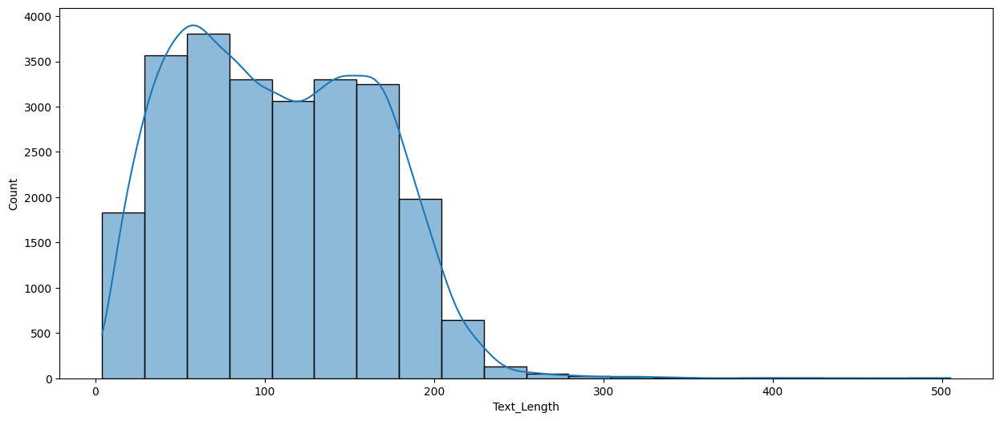

In [118]:
plt.figure(figsize=(15,6))
sns.histplot(df4['Text_Length'], kde = True, bins = 20, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

C:\Users\ST\AppData\Local\Temp\ipykernel_6304\1668202491.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




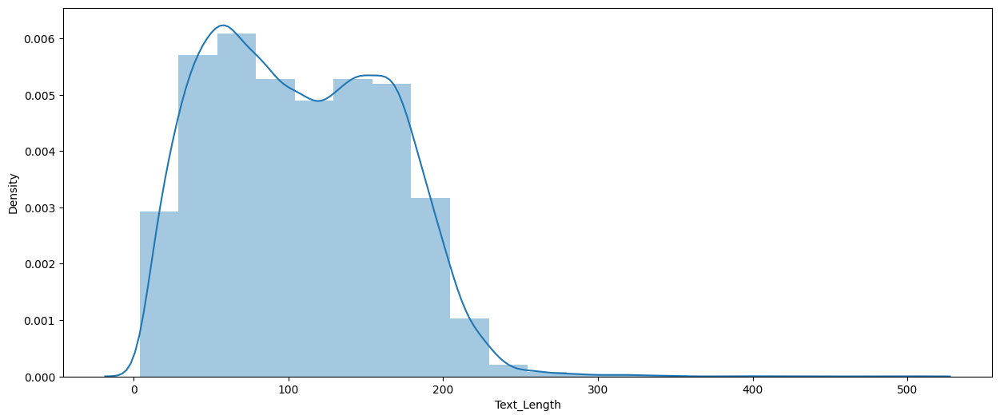

In [119]:
plt.figure(figsize=(15,6))
sns.distplot(df4['Text_Length'], kde = True, bins = 20)
plt.xticks(rotation = 0)
plt.show()

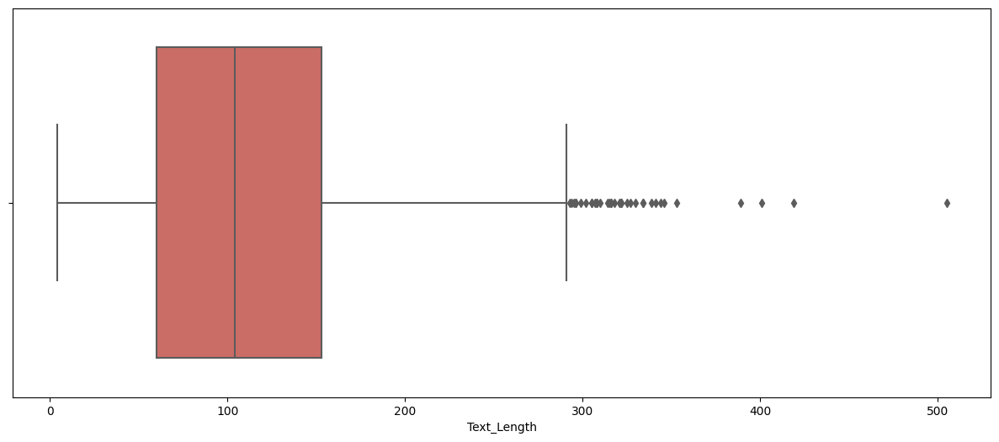

In [120]:
plt.figure(figsize=(15,6))
sns.boxplot(x='Text_Length', data = df4, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

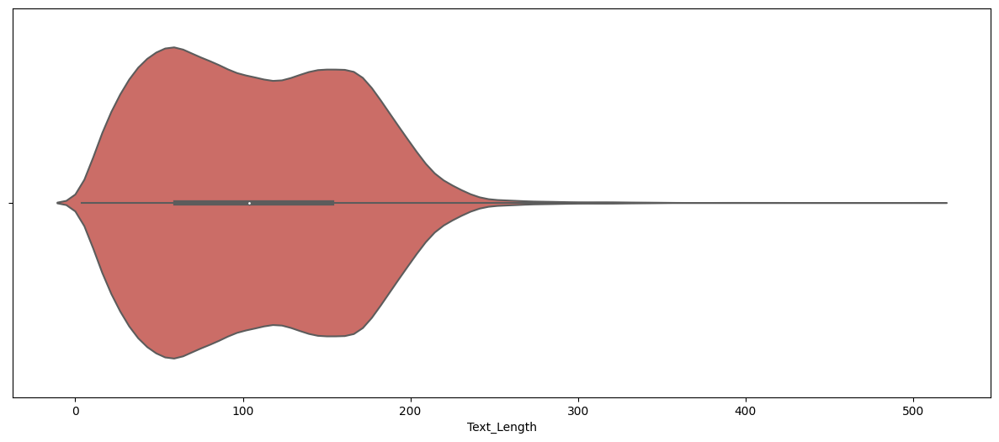

In [121]:
plt.figure(figsize=(15,6))
sns.violinplot(x='Text_Length', data = df4, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

In [122]:
import wordcloud

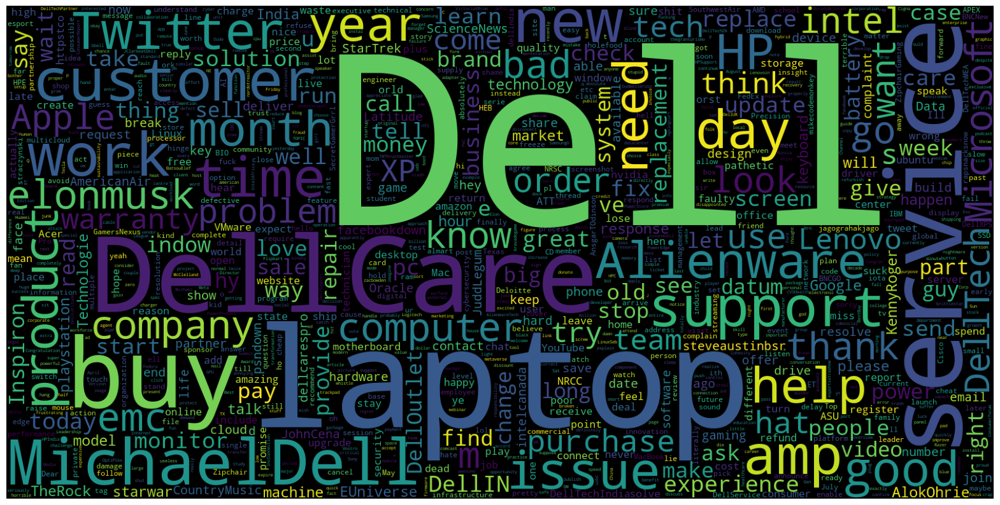

In [123]:
from wordcloud import WordCloud
data = df4['Text']
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data))
plt.imshow(wc)
plt.axis('off')
plt.show()

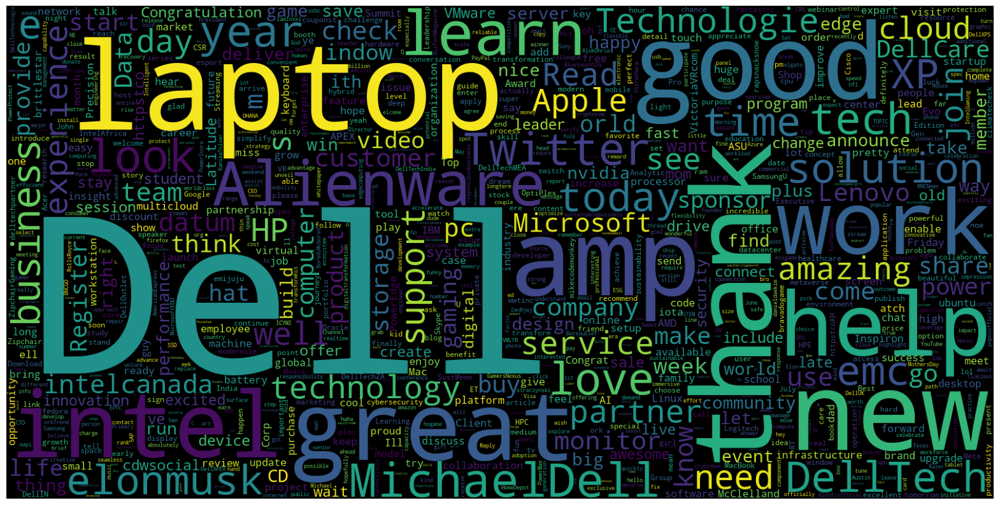

In [124]:
data = df4[df4['sentiment']=="positive"]['Text']
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data))
plt.imshow(wc)
plt.axis('off')
plt.show()

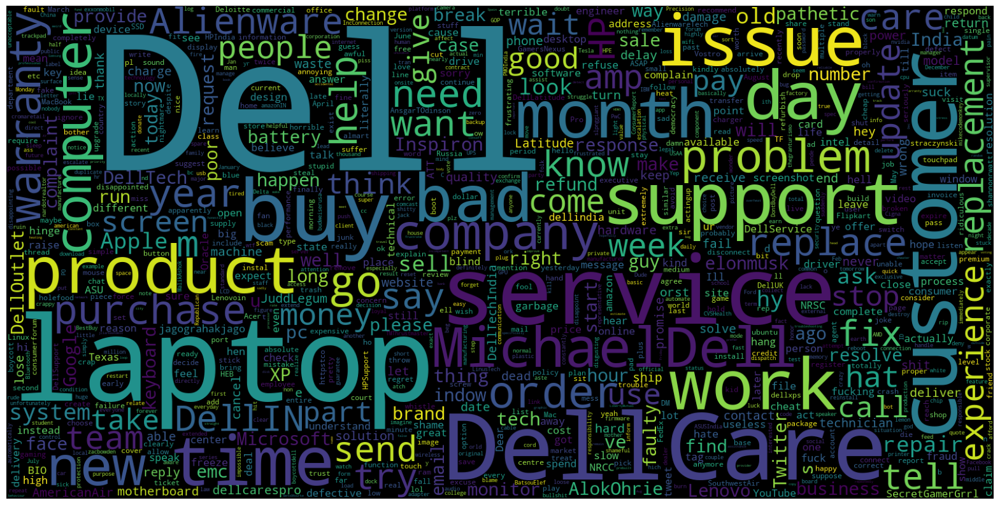

In [125]:
data = df4[df4['sentiment']=="negative"]['Text']
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data))
plt.imshow(wc)
plt.axis('off')
plt.show()

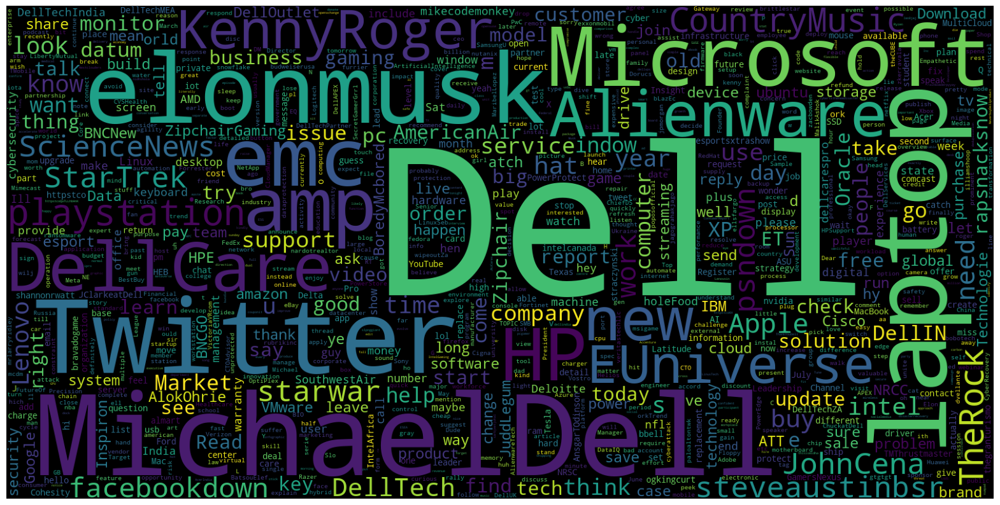

In [126]:
data = df4[df4['sentiment']=="neutral"]['Text']
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data))
plt.imshow(wc)
plt.axis('off')
plt.show()

In [127]:
df5 = df4[['Text','sentiment']]

In [128]:
df5

,Text,sentiment
0,logitech apple Google Microsoft Dell Lenovo ha...,neutral
1,MKhabitaddict officialsti MortalKombat newzeal...,neutral
2,as CRN celebrate anniversary Bob Faletra steve...,positive
3,dell customer service horrible especially agen...,negative
4,zacokalo Dell DellCares Dell man pay,neutral
...,...,...
24965,GamersNexus Dell I not know blow whistle the p...,negative
24966,kitereal GamersNexus Dell I not leave ethical ...,positive
24967,hey JoshTheFixer UHD usbc Dell httpstcoqRlOBzJxoA,neutral
24968,bravadogame thewolfpena Alienware intel IntelA...,neutral


## Model Creation

In [129]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report
from sklearn.naive_bayes import MultinomialNB

In [130]:
X = df['Text']
y = df['sentiment']
X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2,random_state=42)

In [131]:
vectorizer = TfidfVectorizer()
X_train_vectorized = vectorizer.fit_transform(X_train)
X_test_vectorized = vectorizer.transform(X_test)

In [132]:
naive_bayes = MultinomialNB()

In [133]:
naive_bayes.fit(X_train_vectorized, y_train)

MultinomialNB()

In [134]:
y_pred = naive_bayes.predict(X_test_vectorized)

In [135]:
accuracy = accuracy_score(y_test,y_pred)
cr = classification_report(y_test,y_pred)

In [136]:
print("Accuracy:",accuracy)
print("Classification Report:\n",cr)

Accuracy: 0.6822186623948738
Classification Report:
               precision    recall  f1-score   support

    negative       0.62      0.98      0.76      2113
     neutral       0.81      0.29      0.43      1419
    positive       0.79      0.62      0.70      1462

    accuracy                           0.68      4994
   macro avg       0.74      0.63      0.63      4994
weighted avg       0.73      0.68      0.65      4994



In [137]:
param_grid = {
    'alpha': [0.1, 0.5, 1.0],  # Smoothing parameter
    'fit_prior': [True, False]  # Whether to learn class prior probabilities or not
}

In [138]:
from sklearn.model_selection import GridSearchCV

In [139]:
grid_search = GridSearchCV(estimator=naive_bayes, param_grid=param_grid, cv=5)
grid_search.fit(X_train_vectorized, y_train)

GridSearchCV(cv=5, estimator=MultinomialNB(),
             param_grid={'alpha': [0.1, 0.5, 1.0], 'fit_prior': [True, False]})

In [140]:
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

In [141]:
y_pred = best_model.predict(X_test_vectorized)

In [142]:
accuracy = accuracy_score(y_test,y_pred)

In [143]:
accuracy

0.7398878654385262

In [144]:
cr = classification_report(y_test, y_pred)

In [145]:
print(cr)

              precision    recall  f1-score   support

    negative       0.76      0.92      0.83      2113
     neutral       0.68      0.50      0.57      1419
    positive       0.75      0.71      0.73      1462

    accuracy                           0.74      4994
   macro avg       0.73      0.71      0.71      4994
weighted avg       0.73      0.74      0.73      4994



In [146]:
df6 = df4[['Text','sentiment']]

In [147]:
df6

,Text,sentiment
0,logitech apple Google Microsoft Dell Lenovo ha...,neutral
1,MKhabitaddict officialsti MortalKombat newzeal...,neutral
2,as CRN celebrate anniversary Bob Faletra steve...,positive
3,dell customer service horrible especially agen...,negative
4,zacokalo Dell DellCares Dell man pay,neutral
...,...,...
24965,GamersNexus Dell I not know blow whistle the p...,negative
24966,kitereal GamersNexus Dell I not leave ethical ...,positive
24967,hey JoshTheFixer UHD usbc Dell httpstcoqRlOBzJxoA,neutral
24968,bravadogame thewolfpena Alienware intel IntelA...,neutral


In [148]:
!pip install xgboost

In [149]:
import xgboost as xgb

In [150]:
from sklearn.preprocessing import LabelEncoder

In [151]:
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(df6['sentiment'])

In [152]:
X = df6['Text']
y = y_encoded

In [153]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [154]:
xg_model = xgb.XGBClassifier()
xg_model.fit(X_train_vectorized, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [155]:
y_pred = xg_model.predict(X_test_vectorized)
accuracy = accuracy_score(y_test, y_pred)
classification_report = classification_report(y_test, y_pred)

print("Accuracy:", accuracy)
print("Classification Report:")
print(classification_report)

Accuracy: 0.7545054064877853
Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.84      0.82      2113
           1       0.65      0.65      0.65      1419
           2       0.78      0.73      0.75      1462

    accuracy                           0.75      4994
   macro avg       0.75      0.74      0.74      4994
weighted avg       0.75      0.75      0.75      4994



In [156]:
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of trees
    'learning_rate': [0.1, 0.01, 0.001],  # Learning rate
    'max_depth': [3, 5, 7]  # Maximum depth of each tree
}

In [157]:
# Perform grid search using cross-validation
grid_search = GridSearchCV(estimator=xg_model, param_grid=param_grid, cv=5)

In [158]:
import pickle

with open('naive_bayes_model.pkl', 'wb') as file:
    pickle.dump(best_model, file)

In [159]:
with open('tfidf_vectorizer.pkl', 'wb') as file:
    pickle.dump(vectorizer, file)

In [160]:
df6

,Text,sentiment
0,logitech apple Google Microsoft Dell Lenovo ha...,neutral
1,MKhabitaddict officialsti MortalKombat newzeal...,neutral
2,as CRN celebrate anniversary Bob Faletra steve...,positive
3,dell customer service horrible especially agen...,negative
4,zacokalo Dell DellCares Dell man pay,neutral
...,...,...
24965,GamersNexus Dell I not know blow whistle the p...,negative
24966,kitereal GamersNexus Dell I not leave ethical ...,positive
24967,hey JoshTheFixer UHD usbc Dell httpstcoqRlOBzJxoA,neutral
24968,bravadogame thewolfpena Alienware intel IntelA...,neutral


In [161]:
df7=df6.copy()

In [171]:
!pip install tensorflow 

     ---------------------------------------- 0.0/276.5 MB ? eta -:--:--
     ---------------------------------------- 0.1/276.5 MB 3.3 MB/s eta 0:01:24
     ---------------------------------------- 0.3/276.5 MB 2.0 MB/s eta 0:02:21
     ---------------------------------------- 0.4/276.5 MB 2.3 MB/s eta 0:01:59
     ---------------------------------------- 0.6/276.5 MB 2.4 MB/s eta 0:01:55
     ---------------------------------------- 0.7/276.5 MB 2.4 MB/s eta 0:01:53
     ---------------------------------------- 0.9/276.5 MB 2.7 MB/s eta 0:01:41
     ---------------------------------------- 1.1/276.5 MB 2.8 MB/s eta 0:01:39
     ---------------------------------------- 1.2/276.5 MB 2.8 MB/s eta 0:01:38
     ---------------------------------------- 1.2/276.5 MB 2.7 MB/s eta 0:01:44
     ---------------------------------------- 1.3/276.5 MB 2.5 MB/s eta 0:01:52
     ---------------------------------------- 1.5/276.5 MB 2.6 MB/s eta 0:01:48
     ---------------------------------------- 1

In [167]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Embedding, Conv1D, MaxPooling1D, LSTM, Dense
from sklearn.model_selection import train_test_split
import numpy as np

# Encode the labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(df7['sentiment'])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df7['Text'], y_encoded, test_size=0.2, random_state=42)

# Tokenize the text data
tokenizer = Tokenizer(num_words=10000)
tokenizer.fit_on_texts(X_train)
X_train_sequences = tokenizer.texts_to_sequences(X_train)
X_test_sequences = tokenizer.texts_to_sequences(X_test)

# Pad the sequences
max_len = 100
X_train_padded = pad_sequences(X_train_sequences, maxlen=max_len)
X_test_padded = pad_sequences(X_test_sequences, maxlen=max_len)

# Create the CNN-LSTM model
cnn_model = Sequential()
cnn_model.add(Embedding(input_dim=10000, output_dim=32, input_length=max_len))
cnn_model.add(Conv1D(32, 5, activation='relu'))
cnn_model.add(MaxPooling1D(pool_size=4))
cnn_model.add(LSTM(32))
cnn_model.add(Dense(3, activation='softmax'))

# Compile the model
cnn_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
cnn_model.fit(X_train_padded, y_train, epochs=10, batch_size=32)

# Evaluate the model
loss, accuracy = cnn_model.evaluate(X_test_padded, y_test)
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)

Epoch 1/10
625/625 [==============================] - 77s 90ms/step - loss: 0.7097 - accuracy: 0.6726
Epoch 2/10
625/625 [==============================] - 55s 88ms/step - loss: 0.4335 - accuracy: 0.8272
Epoch 3/10
625/625 [==============================] - 51s 81ms/step - loss: 0.1301 - accuracy: 0.9556
Epoch 6/10
625/625 [==============================] - 48s 77ms/step - loss: 0.0856 - accuracy: 0.9721
Epoch 7/10
625/625 [==============================] - 47s 75ms/step - loss: 0.0599 - accuracy: 0.9810
Epoch 8/10
625/625 [==============================] - 47s 75ms/step - loss: 0.0446 - accuracy: 0.9861
Epoch 9/10
625/625 [==============================] - 48s 76ms/step - loss: 0.0349 - accuracy: 0.9893
Epoch 10/10
157/157 [==============================] - 6s 20ms/step - loss: 1.5112 - accuracy: 0.7425
Test Loss: 1.5112183094024658
Test Accuracy: 0.7424910068511963


 ## Save the trained model

In [168]:

cnn_model.save('sentiment_analysis_model.h5')

C:\Users\ST\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



In [169]:
from keras.models import load_model

# Load the saved model
loaded_model = load_model('sentiment_analysis_model.h5')

# Use the loaded model for predictions or further training